<a href="https://colab.research.google.com/github/simodepth96/Data-Science-Portfolio/blob/main/Official_Linear_regression_model_in_Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Introduction to Linear Regression**
Linear regression is a powerful modeling technique that can be used to understand the relationship between a quantitative variable and **one or more other variables** with the goal of making predictions.

##**Simple Linear Regression**
When there is a single input variable, the regression is referred to as Simple Linear Regression

We use the single variable (independent) to model a linear relationship with the target variable (dependent). We do this by fitting a model to describe the relationship.

##**Multiple Linear Regression**
If there is more than one predicting variable, the regression is referred to as Multiple Linear Regression.

##**Goal of Linear Regression**
The goal of linear regression is to find the best fit line (**OLS**) that describes the relationships between variables.

---

##Key Regression Components

When performing simple linear regression, the four main components are:

- **Dependent Variable** — the thing we want to explain
- **Independent Variable** — The factor we think might influence the dependent variable
- **Slope** — Angle of the line / denoted as m or `𝛽1`
- **Intercept** — Where function crosses the y-axis / denoted as 𝑐 or 𝛽0

**Regression equation**

`y = mx + b`

where `m` is the slope and `b` is the intercept.

###**R-Squared**
R-Squared is referrred to as the sum of squared errors determining how well a model fits the data.

In layman's terms, R-squared attempts to measure how much variation in the the object of your analysis (dependent variable) is explained by the independent variable.

Note that this won't fully represent the relationship between variables.

`Error = y_actual - y_predicted`

R-squared ranges from 0 to 1, with higher values representing a better fit.

- **Low R-squared values are not always a problem**, especially if the independent variables are statistically significant.

- **High R-squared values are not necessarily good, as they can be influenced** by specification bias, overfitting, or data mining.
To fully assess model fit, residual plots and other statistics should be considered.

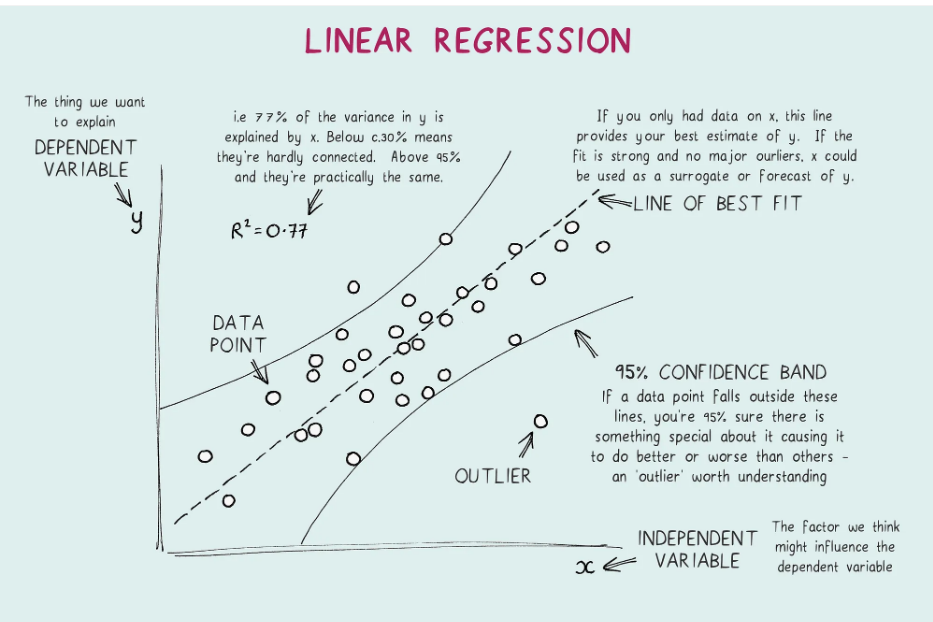

#Import Packages and a Given Data frame

In [ ]:
!pip install plotly
!pip install sklearn
!pip install gradient_descent_funcs

#Data Manipulation and Visualization
import pandas as pd # For manipulating dataframes
import numpy as np # For numerical work
import seaborn as sns # For plotting graphs
import plotly.express as px # For plotting graphs
import matplotlib.pyplot as plt # For plotting graphs
%matplotlib inline

#For converting dates
import datetime
from datetime import datetime

#Scipy
from math import sqrt
import scipy.signal
from scipy import stats # For statistical calculations
from scipy.stats import f_oneway # For One Way ANOVA
from statsmodels.formula.api import ols # For determining the best fit regression line
from scipy.stats import boxcox
from scipy.stats import pearsonr # For regression
from statsmodels.stats.anova import anova_lm # For ANOVA
from statsmodels.stats.multicomp import MultiComparison
from statsmodels.graphics.gofplots import qqplot
import statsmodels.formula.api as smf
import statsmodels.api as sm
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

#Sklearn
import sklearn.metrics as metrics
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score #for regression model interpretation scores
from sklearn.model_selection import train_test_split #for train test spliting
from sklearn.linear_model import LinearRegression,Lasso,Ridge #for linear regression
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV # for hyperparameter tuning
from sklearn.preprocessing import PowerTransformer

#Markdown
import warnings
from IPython.display import display, Math, Latex, Markdown
from IPython.display import display_html, display_markdown, HTML
from IPython.core.display import display

def md(text):
    return display_markdown(text, raw=True)
%matplotlib inline

warnings.filterwarnings("ignore")

  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
ERROR: Could not find a version that satisfies the requirement gradient_descent_funcs (from versions: none)
ERROR: No matching distribution found for gradient_descent_funcs


In [ ]:
# DataFrame formatting function from https://stackoverflow.com/a/51593236

def print_full(x):
    pd.set_option('display.max_rows', None)
    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', 2000)
    pd.set_option('display.float_format', '{:20,.2f}'.format)
    pd.set_option('display.max_colwidth', None)
    print(x)
    pd.reset_option('display.max_rows')
    pd.reset_option('display.max_columns')
    pd.reset_option('display.width')
    pd.reset_option('display.float_format')
    pd.reset_option('display.max_colwidth')

In [ ]:
#@title Importing and pre-processing the Dataset
#Import Excel file
df = pd.read_excel("/content/kering_data.xlsx")

#Import CSV with separator
#df = pd.read_csv('./clientData.csv', sep=',')

#Normalize column names
df.columns = map(str.lower, df.columns)
column_names = df.columns.tolist()

print("Total Rows and Columns: ", df.shape)
df.head()
#df.tail()

Total Rows and Columns:  (91, 14)


,date,clicks,impressions,http 200,http 301,http 302,http 304,http 404,html,images,other file type,javascript,json,page resource load
0,2024-01-26,6882,126506,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2024-01-27,4142,98476,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2024-01-28,5064,97536,33235.0,6081.0,3610.0,32.0,1531.0,6310.0,17665.0,9752.0,942.0,6257.0,26984.0
3,2024-01-29,8068,118259,36094.0,5568.0,3723.0,26.0,1648.0,8210.0,18036.0,9369.0,1299.0,6838.0,27962.0
4,2024-01-30,8133,120378,30971.0,4511.0,2770.0,28.0,1329.0,6199.0,16726.0,7347.0,969.0,5330.0,24783.0


## Quick EDA - Missing Values and Outliers Identification

In [ ]:
#Ensure all variable are integers
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91 entries, 0 to 90
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   date                91 non-null     datetime64[ns]
 1   clicks              91 non-null     int64         
 2   impressions         91 non-null     int64         
 3   http 200            88 non-null     float64       
 4   http 301            88 non-null     float64       
 5   http 302            88 non-null     float64       
 6   http 304            88 non-null     float64       
 7   http 404            88 non-null     float64       
 8   html                88 non-null     float64       
 9   images              88 non-null     float64       
 10  other file type     88 non-null     float64       
 11  javascript          88 non-null     float64       
 12  json                88 non-null     float64       
 13  page resource load  88 non-null     float64       
d

#Missing Data
---

- **Missing Completely at Random (MCAR)**= no logical reason why data is missing. Pure chance.

E.g. technical problems, glitches from reporting on:
GSC search performance
Ahrefs
Screaming frog crawls


- **Missing at Random** = systematic relationship between missing values and the observed data.
**P(A|B) = P(A)**
So here missing values exist due to another variable in your dataset.

E.g. If no-indexed pages (Indexability column) are more likely to have an empty meta description, it would fall under MAR.


- **Missing Not at Random (MNAR)**: missing data due to a human error.

E.g. pages with more traffic are less likely to have meta descriptions. This implies you didn't connect any API with traffic data.


In [ ]:
#@title Look for missing data
# counts the number of missing values in each column
df.isna().sum()

date                  0
clicks                0
impressions           0
http 200              3
http 301              3
http 302              3
http 304              3
http 404              3
html                  3
images                3
other file type       3
javascript            3
json                  3
page resource load    3
dtype: int64

##How much can you Delete?

1. If **less than 20% of data is missing**, then we are safe to use **listwise** deletion
1. If **20%-60% of data is missing**, then we are safe to use **pairwise** deletion
3. If **more than 80% of data is missing**, then we are safe to use **drop columns** deletion


In [ ]:
#@title Calculate the Percentage of Missing Data
maxRows = df['date'].count() #this is the first header in the index

print('% Missing Data:')
print((1 - df.count() / maxRows) * 100)

% Missing Data:
date                  0.000000
clicks                0.000000
impressions           0.000000
http 200              3.296703
http 301              3.296703
http 302              3.296703
http 304              3.296703
http 404              3.296703
html                  3.296703
images                3.296703
other file type       3.296703
javascript            3.296703
json                  3.296703
page resource load    3.296703
dtype: float64


In [ ]:
#@title Listwise Deletion

# Drop rows that have any missing data
new.dropna(inplace=True)
print(f'the number of rows is {new.shape[0]}')
print(f'missing data is {new.isna().sum().sum()}')

In [ ]:
print(df.columns)

Index(['date', 'clicks', 'impressions', 'http 200', 'http 301', 'http 302',
       'http 304', 'http 404', 'html', 'images', 'other file type',
       'javascript', 'json', 'page resource load'],
      dtype='object')


In [ ]:
#@title Pairwise Deletion
df.dropna(subset=['http 200', 'http 301', 'http 302',
       'http 304', 'http 404', 'html', 'images', 'other file type',
       'javascript', 'json', 'page resource load'], #only looks at these two columns
            inplace=True, #removes the rows and keeps the data variable
            how='any') #removes data with missing data in either field

df.head()

,date,clicks,impressions,http 200,http 301,http 302,http 304,http 404,html,images,other file type,javascript,json,page resource load
2,2024-01-28,5064,97536,33235.0,6081.0,3610.0,32.0,1531.0,6310.0,17665.0,9752.0,942.0,6257.0,26984.0
3,2024-01-29,8068,118259,36094.0,5568.0,3723.0,26.0,1648.0,8210.0,18036.0,9369.0,1299.0,6838.0,27962.0
4,2024-01-30,8133,120378,30971.0,4511.0,2770.0,28.0,1329.0,6199.0,16726.0,7347.0,969.0,5330.0,24783.0
5,2024-01-31,7609,113968,31514.0,3913.0,2369.0,27.0,957.0,5282.0,18190.0,6349.0,996.0,5164.0,26263.0
6,2024-02-01,7165,115763,34988.0,5313.0,3188.0,35.0,1956.0,9032.0,16354.0,8586.0,1213.0,6152.0,26019.0


In [ ]:
#Convert all columns to int
df = df.astype(int)

#drop date and CTR
df.drop(['date'],axis=1, inplace=True)

In [ ]:
df.describe(include='all')

,clicks,impressions,http 200,http 301,http 302,http 304,http 404,html,images,other file type,javascript,json,page resource load
count,88.000000,88.000000,88.000000,88.000000,88.000000,88.000000,88.000000,88.000000,88.000000,88.000000,88.000000,88.000000,88.000000
mean,6850.170455,108153.306818,49023.886364,7411.943182,5438.170455,55.500000,2508.613636,16292.079545,21199.000000,12941.193182,1367.079545,8819.113636,33406.113636
std,2123.827645,17872.806551,16575.883686,3252.725628,2428.591660,51.035259,2174.444489,13426.394285,3366.085294,5650.161993,742.425773,3471.992212,5530.079492
min,3530.000000,74402.000000,30971.000000,3594.000000,2369.000000,12.000000,957.000000,5282.000000,12331.000000,6305.000000,620.000000,5164.000000,22206.000000
25%,4885.500000,96589.750000,40376.250000,5387.250000,3851.250000,31.750000,1524.250000,9896.500000,18844.500000,9360.500000,945.000000,6501.000000,29570.750000
50%,7329.500000,109000.500000,44334.500000,6253.500000,4666.000000,44.500000,1809.500000,11997.500000,22463.500000,10991.500000,1179.500000,7417.000000,32618.500000
75%,8025.500000,118339.750000,50807.250000,8380.000000,6217.750000,56.000000,2649.000000,16482.250000,23522.250000,14692.250000,1525.750000,10233.250000,36874.750000
max,13571.000000,185815.000000,130878.000000,20435.000000,14136.000000,378.000000,17242.000000,85563.000000,27530.000000,34065.000000,5552.000000,22521.000000,49223.000000


## Visualize Outliers
Outliers are extreme values that sit 3standard deviations away from the dataset's mean.

A standard deviation indicates indicates how much the observed values deviate from the mean (or the average).

The smaller the standard deviation, the smaller the chances of outliers.

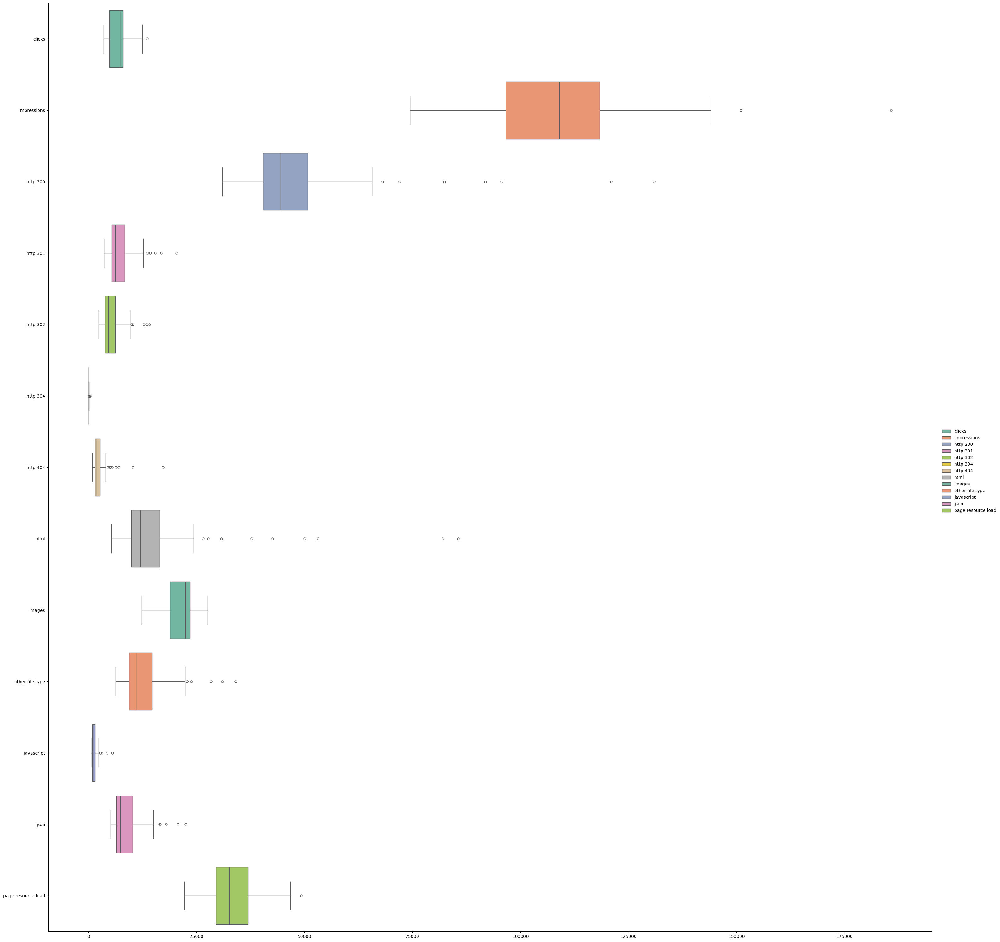

In [ ]:
boxPlots = sns.catplot (palette="Set2", legend=True,
            data=df, kind="box", sharex=True, sharey=True,
            height=30, orient="h");


In [ ]:
#commentary
md("###Outliers detected on crawl requests refresh and crawl requests discovery\n")
md("###It's pretty clear already from the catplot that the all variables do not follow a normal distribution.\n### Spearman's coefficient for correlation will be used")

###Outliers detected on crawl requests refresh and crawl requests discovery


###It's pretty clear already from the catplot that the all variables do not follow a normal distribution.
### Spearman's coefficient for correlation will be used

In [ ]:
#@title Run a Data Profiling Report for in-depth EDA
!pip install -U pandas-profiling
!pip install -U ydata-profiling

from ydata_profiling import ProfileReport
from ydata_profiling.utils.cache import cache_file
import matplotlib.pyplot as plt  # Importing matplotlib.pyplot as plt

profile = ProfileReport(df, minimal=True, title="Profiling Report: Pagination")
profile.to_notebook_iframe()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.9/357.9 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 14.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 14.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 21.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=e07f9ba8f051298b95086ebf7bc03eb730ad9050e125951d5b09c6957999b7fd
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:
      Successfully uninstalled seaborn-0.13.1


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Inspect Outliers Distribution on the most affected variables - See Catplot Above
import plotly.express as px

# Assuming 'crawl requests discovery' is the name of the column containing the crawl request discovery data
fig = px.box(df, y=['other file type', 'json','javascript','html','http 200','http 301','http 404','http 302' ], points="all")
fig.update_layout(title='Box Plot of Crawl Requests Refresh and Crawl Requests Discovery')
fig.show()


In [ ]:
#@title Crawl Requests Refresh - 1.5 IQR rule to detect outliers
Q3 = 1.530
Q1 = 944

IQR = df['javascript'].quantile(0.75) - df['javascript'].quantile(0.25)

# Define the lower and upper bounds for outlier detection
lower_bound = Q1 - (1.5 * IQR)
upper_bound = Q3 + (1.5 * IQR)

# Calculate standard deviation
ni_std = df['javascript'].std()
print(f"The std is {ni_std}")

# Detect outliers
ni_outliers = df[(df['javascript'] < lower_bound) | (df['javascript'] > upper_bound)]

# Print the outliers
print(ni_outliers['javascript'])


The std is 742.4257727763427
2      942
3     1299
4      969
5      996
6     1213
      ... 
84     981
85    1375
86     938
87    1489
89    1521
Name: javascript, Length: 71, dtype: int64


In [ ]:
#@title Calculate the Weight of Outliers within the feature

total_values = len(df['javascript'])

percentage_outliers = (len(ni_outliers) / total_values) * 100

md(f"##Outliers weight on crawl requests refresh: {percentage_outliers:.2f}%")

##Outliers weight on crawl requests refresh: 80.68%

In [ ]:
#@title Crawl Requests Discovery - 1.5 IQR rule to detect outliers
Q3 = 1725
Q1 = 1158

IQR = df['crawl requests discovery'].quantile(0.75) - df['crawl requests discovery'].quantile(0.25)

# Define the lower and upper bounds for outlier detection
lower_bound = Q1 - (1.5 * IQR)
upper_bound = Q3 + (1.5 * IQR)

# Calculate standard deviation
ni_std = df['crawl requests discovery'].std()
print(f"The std is {ni_std}")

# Detect outliers
ni_outliers = df[(df['crawl requests discovery'] < lower_bound) | (df['crawl requests discovery'] > upper_bound)]

# Print the outliers
print(ni_outliers['crawl requests discovery'])


The std is 607.9005561824208
1     3141
20    2577
29    4555
48    3575
73    3263
Name: crawl requests discovery, dtype: int64


In [ ]:
#@title Calculate the Weight of Outliers within the feature

total_values = len(df['crawl requests discovery'])

percentage_outliers = (len(ni_outliers) / total_values) * 100

md(f"##Outliers weight on crawl requests discovery: {percentage_outliers:.2f}%")

##Outliers weight on crawl requests discovery: 5.68%

In [ ]:
#Commentary
md(f"###Crawl Requests Refresh: Problematic - Highly Affected by Outliers \n###Crawl Requests Discovery: Distribution fo Outliers is Minimal")

###Crawl Requests Refresh: Problematic - Highly Affected by Outliers 
###Crawl Requests Discovery: Distribution fo Outliers is Minimal

In [ ]:
#@title Define function to remove outliers

def remove_outlier_IQR(dfWithOutliers):
    Q1=dfWithOutliers.quantile(0.25)
    Q3=dfWithOutliers.quantile(0.75)
    IQR=Q3-Q1
    df_final=dfWithOutliers[~((dfWithOutliers<(Q1-1.5*IQR)) | (dfWithOutliers>(Q3+1.5*IQR)))]
    return df_final

# Removing outliers introduced null values
dfOutliers=df.copy()
dfOutliers=remove_outlier_IQR(df)


In [ ]:
#@title Visualize Missing Data from Outlier Removal
import plotly.express as px

# Assuming dfOutliers is your DataFrame
fig = px.imshow(dfOutliers.isnull(), labels=dict(color="Missing"),
                color_continuous_scale='viridis',
                title='Heatmap of Missing Values in DataFrame')
fig.update_layout(width=800, height=400)
fig.show()


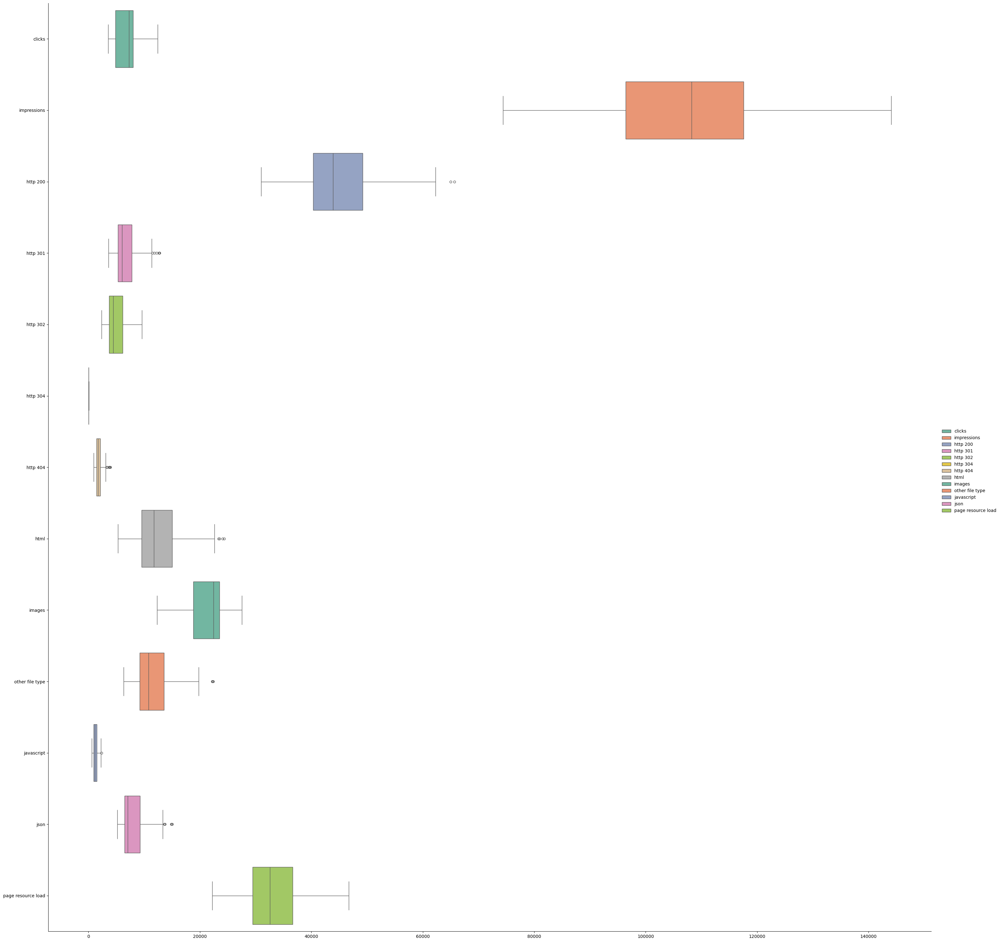

In [ ]:
#@title Data Distribution to fool-proof Outlier Removal
boxPlots = sns.catplot (palette="Set2", legend=True,
            data=dfOutliers, kind="box", sharex=True, sharey=True,
            height=30, orient="h");

## Normalization of the Regression Dataset - without Outliers

---

**Steps**

1. Identify Missing Data and determine the best approach for removal
2. Normalize the dataset

In [ ]:
#@title Look for missing data
# counts the number of missing values in each column
dfOutliers.isna().sum()

clicks                1
impressions           2
http 200              7
http 301              6
http 302              5
http 304              8
http 404              9
html                  9
images                0
other file type       6
javascript            4
json                  5
page resource load    1
dtype: int64

In [ ]:
#@title Calculate the Percentage of Missing Data
maxRows = dfOutliers['clicks'].count() #this is the first header in the index

print('% Missing Data:')
print((1 - dfOutliers.count() / maxRows) * 100)

% Missing Data:
clicks                0.000000
impressions           1.149425
http 200              6.896552
http 301              5.747126
http 302              4.597701
http 304              8.045977
http 404              9.195402
html                  9.195402
images               -1.149425
other file type       5.747126
javascript            3.448276
json                  4.597701
page resource load    0.000000
dtype: float64


In [ ]:
#@title Pairwise Deletion
dfOutliers.dropna(subset=['impressions','http 200', 'http 301', 'http 302',
       'http 304', 'http 404', 'html', 'images', 'other file type',
       'javascript', 'json'], #only looks at these two columns
            inplace=True, #removes the rows and keeps the data variable
            how='any') #removes data with missing data in either field
print(dfOutliers.shape)
dfOutliers.head()

(67, 13)


,clicks,impressions,http 200,http 301,http 302,http 304,http 404,html,images,other file type,javascript,json,page resource load
2,5064.0,97536.0,33235.0,6081.0,3610.0,32.0,1531.0,6310.0,17665,9752.0,942.0,6257.0,26984.0
3,8068.0,118259.0,36094.0,5568.0,3723.0,26.0,1648.0,8210.0,18036,9369.0,1299.0,6838.0,27962.0
4,8133.0,120378.0,30971.0,4511.0,2770.0,28.0,1329.0,6199.0,16726,7347.0,969.0,5330.0,24783.0
5,7609.0,113968.0,31514.0,3913.0,2369.0,27.0,957.0,5282.0,18190,6349.0,996.0,5164.0,26263.0
6,7165.0,115763.0,34988.0,5313.0,3188.0,35.0,1956.0,9032.0,16354,8586.0,1213.0,6152.0,26019.0


In [ ]:
#@title Listwise Deletion

'''
According to the literature, if missing data for a specific variable are <= 20% a listwise deletion is the most condoned approach
'''

# Drop rows that have any missing data
dfOutliers.dropna(inplace=True)
print(f'the number of rows is {dfOutliers.shape[0]}')
print(f'missing data is {dfOutliers.isna().sum().sum()}')

the number of rows is 78
missing data is 0


In [ ]:
dfOutliers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 67 entries, 2 to 87
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   clicks              67 non-null     float64
 1   impressions         67 non-null     float64
 2   http 200            67 non-null     float64
 3   http 301            67 non-null     float64
 4   http 302            67 non-null     float64
 5   http 304            67 non-null     float64
 6   http 404            67 non-null     float64
 7   html                67 non-null     float64
 8   images              67 non-null     int64  
 9   other file type     67 non-null     float64
 10  javascript          67 non-null     float64
 11  json                67 non-null     float64
 12  page resource load  67 non-null     float64
dtypes: float64(12), int64(1)
memory usage: 7.3 KB


In [ ]:
#Normalize all headers to int
dfOutliers = dfOutliers.astype(int)

# Correlation Analysis - Overview with Spearman's Coefficient

Pearson correlation quantifies the strength and direction of a **linear relationship** between two variables.

It has to be used when:
- variables are normally distributed
- calculated based on covariance and standard deviations
- sensitive to outliers
- **Appropriate for interval and ratio data**

Spearman correlation assesses the strength and direction of a **monotonic relationship** between two variables.

It has to be used when:
- variables are not normally distributed
- calculated based on ranked data
- less sensitive to outliers
- **Appropriate for ordinal and non-normally distributed data**

In [ ]:
#@title Review Distribution Assumption post Outliers Removal
profile = ProfileReport(dfOutliers, minimal=True, title="Profiling Report: Pagination")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

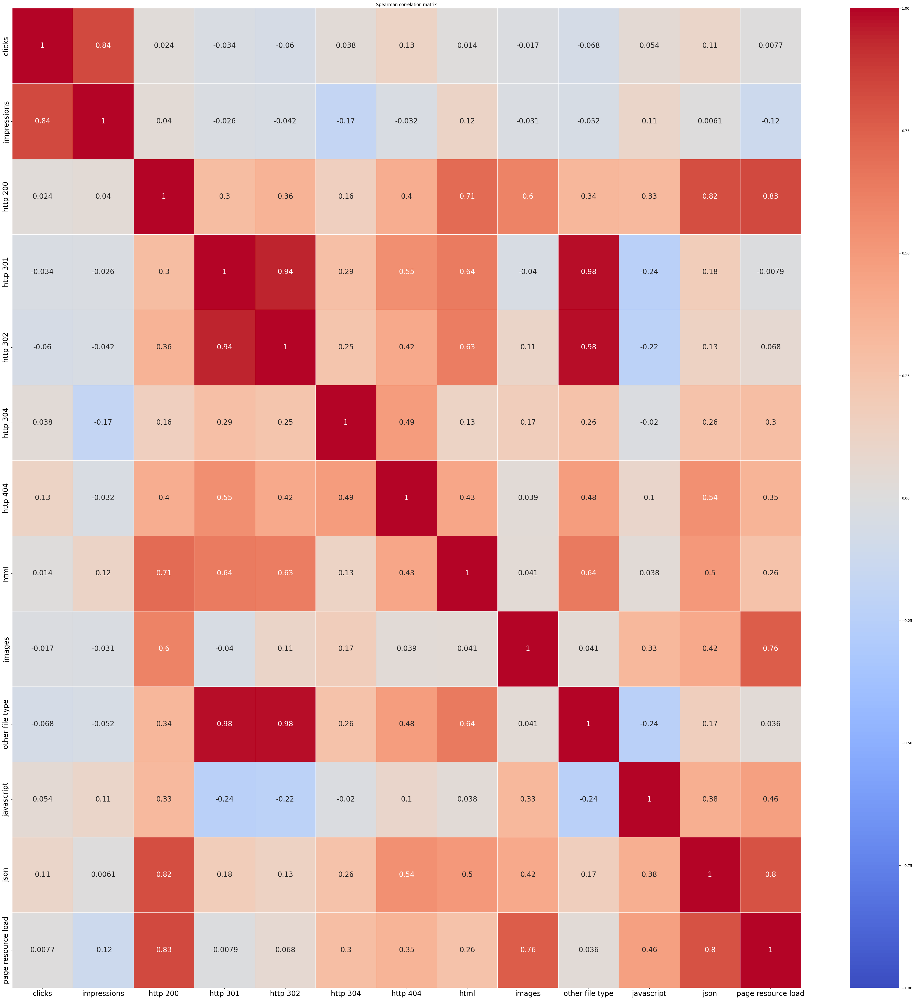

In [ ]:
correlation = dfOutliers.corr(method='spearman');
#mask = np.zeros_like(pCorrMatrix2, dtype=bool)
#mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(50,50))
plt.title("Spearman correlation matrix")
sns.heatmap(correlation,
            vmin=-1,
            cmap='coolwarm',
            linewidths=0.5,
            annot=True,
            annot_kws={"size": 20})
# Adjust tick label font sizes
plt.xticks(fontsize=20)  # Adjust x-axis tick label font size
plt.yticks(fontsize=20)  # Adjust y-axis tick label font size

# Save the pairplot as an image (e.g., in PNG format)
plt.savefig('heatmap.png')

plt.show()

Pair plot of client X showing correlation direction dispersion of points in scatter plots that show the strength of the correlations


<Figure size 50000x50000 with 0 Axes>

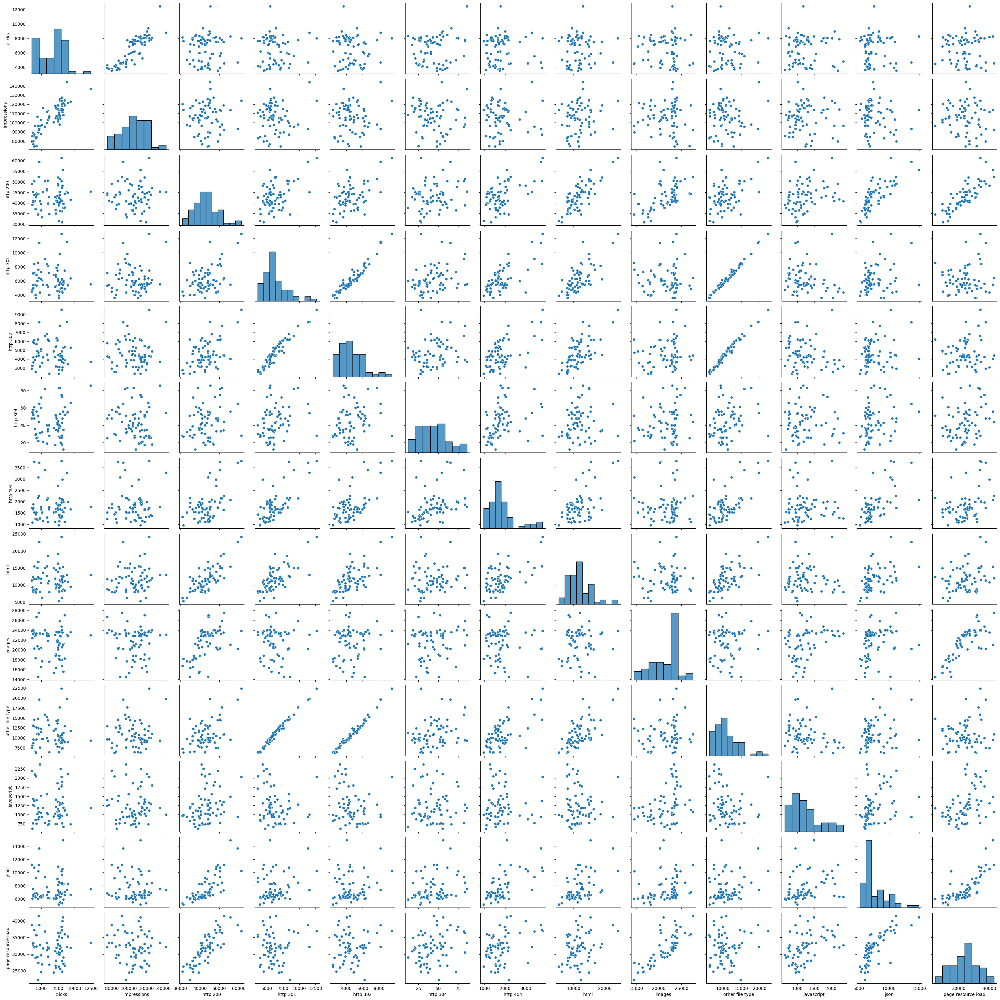

In [ ]:
#@title Create a pair plot
# Seasonality may cause spikes during shopping periods as Google tend to crawl more rapidly before Christmas to keep their index fresh during this time. They also like to apply updates quarterly which means they need an updated look as their alogirithims roll out.
# Not all countries will be the same, so clicks, impressions and position may differ.
plt.figure(figsize=(500,500))
print("Pair plot of client X showing correlation direction dispersion of points in scatter plots that show the strength of the correlations")
sns.pairplot(dfOutliers, diag_kind="hist");

In [ ]:
#Note I've not had time to add input validation, but have focussed on the output.
options = list(dfOutliers.columns)
user_input = ''

input_message = ""
md(f"###What target variable do you want to check correlations against? \nPick a number and enter it into the box below.\n Any other input will result in an hard failure and would require the script to be re-run:\n")

for index, item in enumerate(options):
    input_message += f'{index+1}) {item}\n'

input_message += 'Your choice: '

while user_input not in map(str, range(1, len(options) + 1)):
    user_input = input(input_message)

print('Your target variable: ' + options[int(user_input) - 1] + '\n')
selectedOpt = options[int(user_input) - 1]


#print(correlation[selectedOpt].sort_values(ascending=True))
sortedFeatureList = correlation[selectedOpt].sort_values(ascending=False).round(decimals=2)

MaskedPairs = sortedFeatureList[abs(sortedFeatureList) < 1]
#print(sortedFeatureList)

# Remove other SEO GSC KPIs if selecting a target variable that is a KPI rather than an issue feature
if selectedOpt=="Clicks":
  MaskedPairs.drop(['Impressions'], axis=0, inplace=True)
  MaskedPairs.drop(['CTR'], axis=0, inplace=True)
  MaskedPairs.drop(['Position'], axis=0, inplace=True)
elif selectedOpt=="Impressions":
  MaskedPairs.drop(['Clicks'], axis=0, inplace=True)
  MaskedPairs.drop(['CTR'], axis=0, inplace=True)
  MaskedPairs.drop(['Position'], axis=0, inplace=True)
elif selectedOpt=="CTR":
  MaskedPairs.drop(['Clicks'], axis=0, inplace=True)
  MaskedPairs.drop(['Impressions'], axis=0, inplace=True)
  MaskedPairs.drop(['Position'], axis=0, inplace=True)
elif selectedOpt=="Position":
#Swapped the ordering of the output for avg. position due to smaller being better and anything that negatively decreases it - finish this
  sortedFeatureList.sort_values(ascending=True)
  MaskedPairs.drop(['Clicks'], axis=0, inplace=True)
  MaskedPairs.drop(['Impressions'], axis=0, inplace=True)
  MaskedPairs.drop(['CTR'], axis=0, inplace=True)
#else
#    MaskedPairs.drop(['Clicks'], axis=1, inplace=True)
#    MaskedPairs.drop(['Impressions'], axis=1, inplace=True)
#    MaskedPairs.drop(['Position'], axis=1, inplace=True)


print(MaskedPairs)

md(f"##Tips to interpret\n")
print("What you chose (Target variable) will decrease if correlation of features are negative or increase if correlation of the printed features are positive.\n")
print("Using your SEO experience and audit findings, start with reasons as to why your target variable will increase with strong positive correlations (potential root causes if theory is rational).\n")
print("Then look at the top 3-5 negative correlations and sense check your understanding on why your target variable will decrease if your feature increases. Negative correlations should help rule out options for potential causes.\n")
print("Note that you should use the charts to check if the correlation is linear and dots would be easy to draw a straight line through.\n")
print("Also note that negative correlation can be a reason for increase in say Avg. position or other issues, so be mindful of this when you apply your knowledge to the direction.")



###What target variable do you want to check correlations against? 
Pick a number and enter it into the box below.
 Any other input will result in an hard failure and would require the script to be re-run:


1) clicks
2) impressions
3) http 200
4) http 301
5) http 302
6) http 304
7) http 404
8) html
9) images
10) other file type
11) javascript
12) json
13) page resource load
Your choice: 8
Your target variable: html

http 200              0.71
other file type       0.64
http 301              0.64
http 302              0.63
json                  0.50
http 404              0.43
page resource load    0.26
http 304              0.13
impressions           0.12
images                0.04
javascript            0.04
clicks                0.01
Name: html, dtype: float64


##Tips to interpret


What you chose (Target variable) will decrease if correlation of features are negative or increase if correlation of the printed features are positive.

Using your SEO experience and audit findings, start with reasons as to why your target variable will increase with strong positive correlations (potential root causes if theory is rational).

Then look at the top 3-5 negative correlations and sense check your understanding on why your target variable will decrease if your feature increases. Negative correlations should help rule out options for potential causes.

Note that you should use the charts to check if the correlation is linear and dots would be easy to draw a straight line through.

Also note that negative correlation can be a reason for increase in say Avg. position or other issues, so be mindful of this when you apply your knowledge to the direction.


In [ ]:
MaskedPairs.to_csv('output - Crawl Requests HTML correlation pairs .csv', index=True)

# Multiple Linear Regression
As with most machine learning algorithms, we have to split our dataset into:

- **Training set**: the data used to fit the model
- **Test set**: the data partitioned away at the very start of the experiment (to provide an unbiased evaluation of the model)

In general, **putting 80% of your data in the training set and 20% of your data in the test set is a good place to start**.

In [ ]:
print(dfOutliers.columns)

Index(['clicks', 'impressions', 'blocked by robots', 'page with redirect',
       'duplicate pages without canonical', 'not found', 'excluded by noindex',
       'soft 404', 'submitted pages', 'crawled not indexed',
       'indexed though blocked by robots.txt', 'alternate page with canonical',
       'crawl requests - page resource load', 'crawl requests - 2xx',
       'crawl requests - not found', 'crawl requests html',
       'crawl requests refresh', 'crawl requests discovery'],
      dtype='object')


In [ ]:
from sklearn.model_selection import train_test_split

# Define the independent variables and the dependent variable
independent_columns = [
    'clicks', 'impressions', 'blocked by robots', 'page with redirect',
    'duplicate pages without canonical', 'excluded by noindex',
    'soft 404', 'submitted pages', 'indexed though blocked by robots.txt',
    'alternate page with canonical', 'crawl requests - page resource load',
    'crawl requests refresh']
X = dfOutliers[independent_columns]  # Independent variables
y = dfOutliers['crawl requests - 2xx']  # Dependent variable

# Use scikit-learn's train_test_split() method to split X into 80% training set and 20% testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=6)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)


(62, 12)
(16, 12)
(62,)
(16,)


In [ ]:
#@title Build the linear regression model

from sklearn.linear_model import LinearRegression

mlr = LinearRegression()

mlr.fit(X_train, y_train)

y_predicted = mlr.predict(X_train)

In [ ]:
#@title Create a linear regression model based on Ordinary Least Squares (OLS)
# Fit the OLS model
model = sm.OLS(y_train, sm.add_constant(X_train))
results = model.fit()

intercept = results.params['const']
print("Intercept:", intercept)

# Print the summary
print(results.summary())

Intercept: -31038.306912497384
                             OLS Regression Results                             
Dep. Variable:     crawl requests - 2xx   R-squared:                       0.989
Model:                              OLS   Adj. R-squared:                  0.986
Method:                   Least Squares   F-statistic:                     398.4
Date:                  Mon, 15 Apr 2024   Prob (F-statistic):           1.15e-44
Time:                          12:02:29   Log-Likelihood:                -428.47
No. Observations:                    62   AIC:                             880.9
Df Residuals:                        50   BIC:                             906.5
Df Model:                            11                                         
Covariance Type:              nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------

#**Interpretation of OLS**

OLS regression aims to find the best-fitting linear equation that describes the relationship between the dependent variable (Y) and independent variables (denoted as X1, X2, ..., Xn).

##How do you find the best-fitting linear equation?
OLS minimizes the sum of the squares of the differences between the observed dependent variable values and those predicted by the linear model.

These differences are called "**residuals**" nd the lowest, the better the regression model.


##Legend

- **The left part** of the top table provides information on the data and model
- **The right part**of the top table provides information on how well the model is fit
- **The middle table** is a coefficient report
- **The bottom table** provides information on residuals, autocorrelation, and multicollinearity


##Coefficients
As things stand:

- Crawl Requests for HTTP 2xx increase with **0.98** if **Crawl requests - page resource load** by one.
- Crawl Requests for HTTP 2xx decreases with **-0.0183** if **blocked by robots.txt** pages increase by one.

###**R-Squared**
Percentage of the variance in the dependent variable that the independent variables explain collectively.**How much the independent variable is able to explain from the dependent variable?**

The value of R-Squared is always between 0 to 1 (0% to 100%).

- **A high R-Squared** value means that many data points are close to the linear regression function line.

- **A low R-Squared** value means that the linear regression function line does not fit the data well.

###**Adj. R-Squared**
Inflated R-Squared due to the addition of further independent variables. Despite being misleading, it helps determine the true goodness-of-fit of a model and detect overfitting, where the model fits random noise instead of the actual relationship.

Chasing a high R-squared by including excessive variables can lead to misleading results and imprecise predictions, therefore, it is important to use adjusted R-squared and predicted R-squared to avoid overfitting and maintain model accuracy.

#**P-Value P>|t|**

## Hypothesis Testing
Hypothesis testing is a statistical procedure to test if your results are valid.

Hypothesis test has two statements.

- The **null hypothesis** can be shortly written as H0

- The **alternative hypothesis** can be shortly written as H1

##Hypothesis Testing and P-value

If we reject the null hypothesis, we conclude that it exist a **relationship between variables**.

P-values help determine the significance of results in hypothesis testing, with smaller values typically leading to the rejection of the null hypothesis.

**The P-value simply tells how extreme our data is under the assumption that the null hypothesis is true**.

The lower the P-value, the less likely a result happened by chance and therefore we can conclude a relationship between variables.

##**What p-value is not**

- It’s not a probability of an event occurring = it’s instead the probability of seeing a different result if we were to sample many times.
- It’s not something that tells us how different two samples are. Two samples with the same differences in means but larger/smaller samples sizes will get different p-values.

A p-value is instead telling us how likely it is that they are different (how confident we can be that they are different).

##P-Values in Figures

A p-value is a number between 0 and 1, but it’s easier to think about them as percentages (i.e. a p-value of 0.05 is 5%).
- **Small p-values** (< 0.5) usually lead you to reject the null hypothesis and the coefficient is likely not to equal zero.

- **A high P-value** (> 0.05) means that we cannot conclude that the explanatory variable affects the dependent variable. A high P-value is also called an insignificant P-value.


If the p-value is small, typically below a threshold of 0.05 (or 5%), you can conclude that the outcome from the test is "statistically significant" and not due to random chance.

If the p-value is large (above 0.05), it means that the observed difference could easily be due to random chance. Hence, the test confirms a null hypothesis (H0)

##Example of P-Value Interpretation
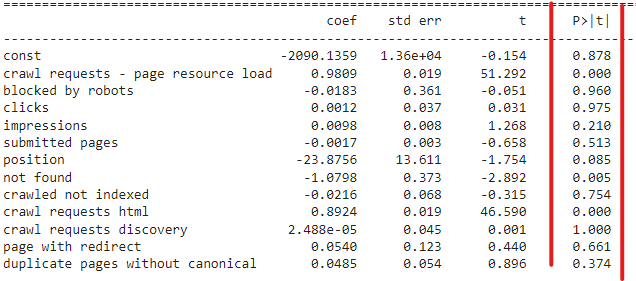

The P-value is not statistically significant for all of the variables, as it is not <= 0.05.

**So here we can conclude there is no relationship between the variables.**


### **T-Statistics**

For each coefficient, the t-statistic and its associated p-value test the null hypothesis that the coefficient is equal to zero (no effect).
A small p-value (< 0.05) suggests that you can reject the null hypothesis.

### **[0.025      0.975]**
**Confidence Intervals**: These intervals provide a range of plausible values for each coefficient (usually at the 95% confidence level)


**BIC**: Bayesian Information Criterion, similar to AIC but with higher penalties.

It is used to compare and select the best model among alternatives based on the likelihood of the model given the data.

The BIC is calculated by considering the sample size, number of parameters estimated by the model, and the likelihood of the model evaluated at maximum likelihood values.


- If the difference is less than 2, it is not significant.
- If it is between 2 and 6, there is positive evidence against the other model.
- If it is between 6 and 10, the evidence is strong. - A difference greater than 10 means the evidence strongly favors the best model.

The model with the lowest BIC is considered the best.

**Omnibus**: Omnibus D’Angostino’s test, statistical test for skewness and kurtosis

**Prob(Omnibus)**: Omnibus statistic as a probability

**Skew**: Measure of data mean symmetry

**Kurtosis**: Measure of shape of the distribution

**Durbin-Watson**: Test for autocorrelation

**Jarque-Bera (JB):** Test for skewness & kurtosis

**Prob (JB): **Jarque-Bera statistic as a probability

**Cond. No.**: Test for multicollinearity

# Assumptions of Regression

The following assumptions are necessary for obtaining reliable results. Otherwise, our results will result in being biased.

1. **Multicollinearity**: look at the OLS summary (Cond. No.: Test for multicollinearity). **If it's large and the model have many predictors, then it's worth treating multicollinearity first with VIF and then re-run another OLS**.
2. **Linearity**
3. **Normality**
4. **Homoscedasticity**
5. **Autocorrelation of Residuals**


#Multi-collinearity

multi-collinearity can influence the regression results when relationships between independent variables influence each other exist (therefore not actually independent).

If your primary goal is to make predictions, and you don’t need to understand the role of each independent variable, you don’t need to reduce severe multicollinearity

**Why it can happen**
- A lot of data is just naturally correlated.
- Multicollinearity could exist because of the problems in the dataset at the time of creation. These problems could be because of poorly designed experiments, highly observational data, or the inability to manipulate the data.
- Multicollinearity could also occur when new variables are created which are dependent on other variables.
- Including identical variables in the dataset.
- Insufficient data, in some cases, can also cause multicollinearity problems.

**How to detect it**

There are a few ways, but we will use a heatmap of the correlation as a visual aid and examine the variance inflation factor (VIF).


**How to fix it**
This can be fixed by other removing predictors with a high variance inflation factor (VIF) or performing dimensionality reduction.

In [ ]:
#Source: https://stackoverflow.com/a/61441713 - I modified the source code further to fit my variables. I found this code practical as it includes the constant required to run VIF properly.

from statsmodels.stats.outliers_influence import variance_inflation_factor

def sklearn_vif(exogs, data):
    '''
    This function calculates variance inflation function in sklearn way.
     It is a comparatively faster process.

    '''
    # initialize dictionaries
    vif_dict, tolerance_dict = {}, {}

    # form input data for each exogenous variable
    for exog in exogs:
        not_exog = [i for i in exogs if i != exog]
        Xvif, yvif = data[not_exog], data[exog]

        # extract r-squared from the fit
        r_squared = LinearRegression().fit(Xvif, yvif).score(Xvif, yvif)

        # calculate VIF
        vif = 1/(1 - r_squared)
        vif_dict[exog] = vif

        # calculate tolerance
        tolerance = 1 - r_squared
        tolerance_dict[exog] = tolerance

    # return VIF DataFrame
    df_vif = pd.DataFrame({'VIF': vif_dict, 'Tolerance': tolerance_dict})

    return df_vif


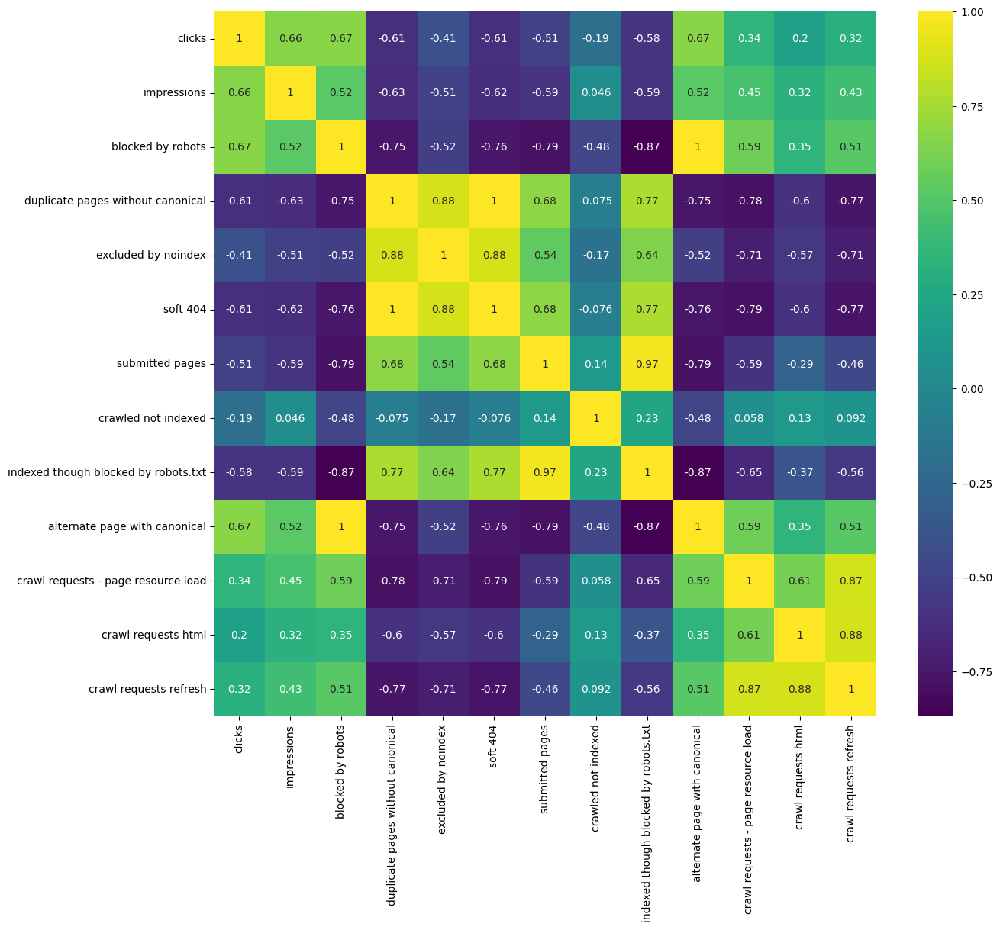

In [ ]:
#@title multi collinearity with a heatmap
#Heatmap (correlation matrix)
plt.figure(figsize=(14, 12))
sns.heatmap(dfOutliers.drop(['page with redirect','not found','crawl requests - not found', 'crawl requests discovery', 'crawl requests - 2xx'], axis=1).corr(method="spearman"), annot=True, cmap='viridis')

plt.show()

#VIF

To improve the model from multi-collinearity, you can use VIF that is a method that identifies and scores variables that correlate highly with other variables, rducing the highest ones to leave those that are more independent

**In the following example, drop as many variables as you can to keep VIF between 1 and 5**

- VIF starts at 1 and has no upper limit
- VIF = 1, no correlation between the independent variable and the other variables
- VIF exceeding 5 or 10 indicates high multicollinearity between this independent variable and the others

In [ ]:
print(dfOutliers.columns)

Index(['clicks', 'impressions', 'blocked by robots', 'page with redirect',
       'duplicate pages without canonical', 'not found', 'excluded by noindex',
       'soft 404', 'submitted pages', 'crawled not indexed',
       'indexed though blocked by robots.txt', 'alternate page with canonical',
       'crawl requests - page resource load', 'crawl requests - 2xx',
       'crawl requests - not found', 'crawl requests html',
       'crawl requests refresh', 'crawl requests discovery'],
      dtype='object')


In [ ]:
#@title Multi-Collinearity with VIF

from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):
    # Dropping a column
    X = X.drop(['impressions','clicks','page with redirect','not found','crawl requests - not found', 'crawl requests - 2xx'],axis=1)

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

X = dfOutliers.iloc[:,:-1]  # Assuming the last column is the one to drop
calc_vif(X)


,variables,VIF
0,blocked by robots,inf
1,duplicate pages without canonical,5.952415e+03
2,excluded by noindex,2.541121e+04
3,soft 404,1.031159e+03
4,submitted pages,5.183277e+03
5,crawled not indexed,8.682482e+02
6,indexed though blocked by robots.txt,1.034535e+03
7,alternate page with canonical,inf
8,crawl requests - page resource load,3.218231e+02
9,crawl requests html,5.044655e+02


Combine the correlated variables into one and drop the others. This will reduce the multicollinearity

In [ ]:
# Assuming the operations on dfOutliers are correctly defined
df2 = dfOutliers.copy()
df2['Blocked'] = df2['blocked by robots'] - df2['indexed though blocked by robots.txt']
df2['Noindex'] = df2['excluded by noindex'] - df2['crawled not indexed']
df2['Canonical issue'] = df2['alternate page with canonical'] - df2['duplicate pages without canonical']
df2['Crawl Requests HTML'] = df2['crawl requests refresh'] - df2['crawl requests html']
df2 = df2.round(decimals=1)
X = df2.drop(['submitted pages','crawl requests discovery','duplicate pages without canonical','alternate page with canonical','blocked by robots','indexed though blocked by robots.txt','excluded by noindex','crawled not indexed','crawl requests html','crawl requests refresh'], axis=1)
calc_vif(X)


,variables,VIF
0,soft 404,97.753606
1,crawl requests - page resource load,170.848725
2,Blocked,8.189540
3,Noindex,313.104103
4,Canonical issue,549.987008
5,Crawl Requests HTML,133.313224


In [ ]:
#commentary
md(f"Multi-collinearity:\n##Unsatisfied")

Multi-collinearity:
##Unsatisfied

In [ ]:
print(X.columns)

Index(['clicks', 'impressions', 'page with redirect', 'not found', 'soft 404',
       'crawl requests - page resource load', 'crawl requests - 2xx',
       'crawl requests - not found', 'Blocked', 'Noindex', 'Canonical issue',
       'Crawl Requests HTML'],
      dtype='object')


In [ ]:
#@title OLS v.2 from VIF
'''
If VIF smoothed out multicollinearity, run another OLS summary until the model is significant
'''

ols = X.drop(['clicks', 'impressions', 'page with redirect', 'not found',
       'crawl requests - not found'], axis=1)

X_with_const = sm.add_constant(ols)  # Add constant term for intercept
ols_model = sm.OLS(y, X_with_const)
ols_results = ols_model.fit()

# Print OLS summary
print(ols_results.summary())

                             OLS Regression Results                             
Dep. Variable:     crawl requests - 2xx   R-squared:                       1.000
Model:                              OLS   Adj. R-squared:                  1.000
Method:                   Least Squares   F-statistic:                 1.464e+29
Date:                  Mon, 15 Apr 2024   Prob (F-statistic):               0.00
Time:                          12:12:47   Log-Likelihood:                 1816.5
No. Observations:                    78   AIC:                            -3617.
Df Residuals:                        70   BIC:                            -3598.
Df Model:                             7                                         
Covariance Type:              nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------

##Linearity
There is a linear relationship between the dependent variable (y) and the independent variable (x) and it assumes the predictors are additive.

###How to detect it
We can check for linearity by creating a scatter plot. Ideally, the points should lie on or around a **straight** line on the scatter plot.

###How to fix it
Either adding polynomial terms to some of the predictors or applying nonlinear transformations . If those do not work, try adding additional variables to help capture the relationship between the predictors and the label.

In [ ]:
print(dfOutliers.columns)

Index(['clicks', 'impressions', 'blocked by robots', 'page with redirect',
       'duplicate pages without canonical', 'not found', 'excluded by noindex',
       'soft 404', 'submitted pages', 'crawled not indexed',
       'indexed though blocked by robots.txt', 'alternate page with canonical',
       'crawl requests - page resource load', 'crawl requests - 2xx',
       'crawl requests - not found', 'crawl requests html',
       'crawl requests refresh', 'crawl requests discovery'],
      dtype='object')


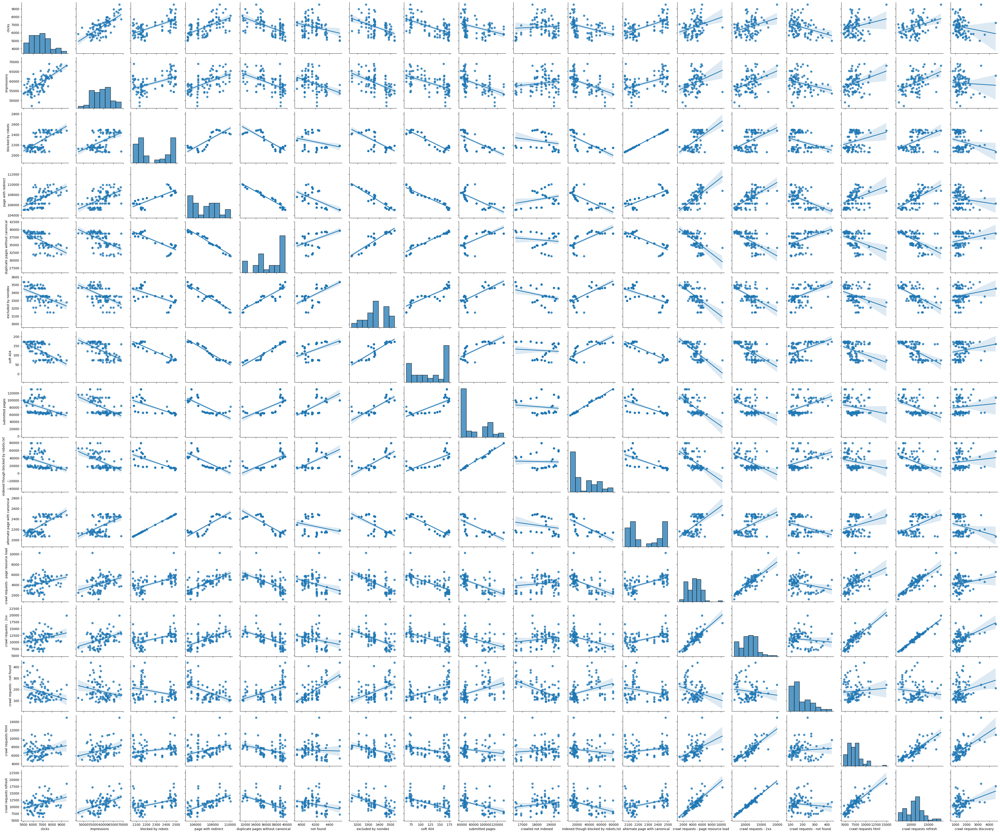

In [ ]:
#@title Linearity Assumption Tested in Bulk
featureCols = list(dfOutliers.columns)
sns.pairplot(df, x_vars=featureCols, y_vars=['clicks', 'impressions', 'blocked by robots', 'page with redirect',
       'duplicate pages without canonical', 'excluded by noindex',
       'soft 404', 'submitted pages',
       'indexed though blocked by robots.txt', 'alternate page with canonical',
       'crawl requests - page resource load', 'crawl requests - 2xx', 'crawl requests html',
       'crawl requests refresh'], kind='reg');


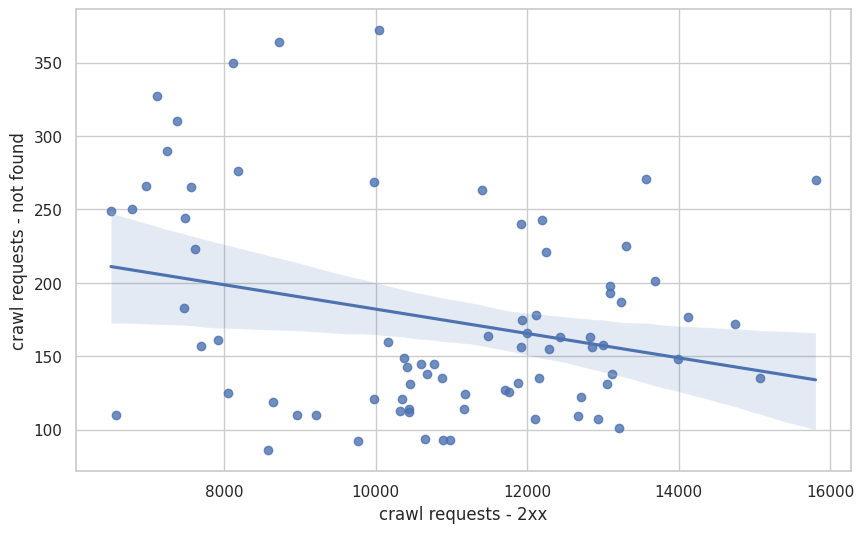

In [ ]:
#@title Test Linearity Assumption 101

'''
start plotting the independent variable with the highest correlation with the dependent variable.
'''
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
sns.regplot(x="crawl requests - 2xx", y="crawl requests - not found", data=dfOutliers)

# Set plot labels
plt.xlabel('crawl requests - 2xx')
plt.ylabel('crawl requests - not found')
plt.ticklabel_format(style='plain')    # to prevent scientific notation.
# Show the plot
plt.show()

In [ ]:
#commentary
md(f"Linearity assumption:\n##Satisfied")

Linearity assumption:
##Satisfied

##Normality assumptions of linear regression

The **normality assumption** states that the residuals (outliers or the differences between the true value and the predicted value) should be normally distributed.

To check this assumption, we can inspect a histogram of the residuals and **make sure that the distribution looks approximately normal** (no skew or multiple “humps").

**Important**

Remember normality is not that spread as they have always made us think. In fact, it's very difficult to get perfect curves, distributions in real life data.
Hence, if the distribution is a little skewed it's not a big deal.

###How to detect it
Plot a histogram to inspect the distribution of residuals. **One of the assumptions of linear regression is that the mean of the residuals should be zero.**

###How to fix it
Nonlinear transformations of the variables, excluding specific variables (such as long-tailed variables), or removing outliers may solve this problem.

Mean of Residuals: -8.214790854723224e-12


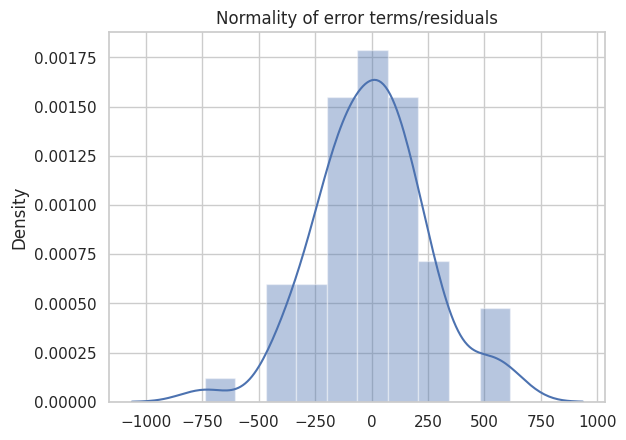

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Calculate residuals
residuals = y_train.values - y_predicted

# Calculate mean of residuals
mean_residuals = np.mean(residuals)
print("Mean of Residuals:", mean_residuals)

# Plot histogram of residuals
p = sns.distplot(residuals,kde=True)
p = plt.title('Normality of error terms/residuals')

In [ ]:
#commentary
md(f"Normality assumption:\n##Satisfied")

Normality assumption:
##Satisfied

#Homoscedasticity assumptions of linear regression

**Homoscedasticity** means **residuals have equal variation** across all values of the predictor variable

**Why it can happen**

Our model may be giving too much weight to a subset of the data, particularly where the error variance was the largest.

- If the homoscedasticity assumption is met, then the plot will look like a **random splatter of points**, centered around y=0.

- If there are **any patterns or asymmetry**, that would indicate the assumption is NOT met and **linear regression may not be appropriate**.

**How to check**

We can check this assumption by using the **Breusch-Pagan test** and **Goldfeld Quandt Test** to see the p-value from the distribution of residuals.

**What it will affect**

Significance tests for coefficients due to the standard errors being biased. Additionally, the confidence intervals will be either too wide or too narrow.

**How to fix it**

- **Transform the dependent variable**: We can alter the dependent variable using some technique. For example, we can take the log of the dependent variable.
- **Redefine the dependent variable**:  We can redefine the dependent variable. For example, using a rate for the dependent variable than the flawed value.
- **Use weighted regression**: The last way is to use weighted regression. In this type of regression, the weight is assigned to each data point on the basis of the variance of its fitted value. Using proper weights can eliminate the problem of heteroscedasticity.

##Homoscedasticity tests
The test uses the following null and alternative hypotheses:

- Null Hypothesis (H0): **Homoscedasticity** is present (the residuals are distributed with equal variance)
- Alternative Hypothesis (H1): **Heteroscedasticity** is present (the residuals are not distributed with equal variance)

**If the p-value of the test is **< 0.05** we reject the null hypothesis and conclude that heteroscedasticity is present in the regression model.**

In [ ]:
#@title Breusch-Pagan
from statsmodels.stats.diagnostic import het_breuschpagan
test_result = sms.het_breuschpagan(results.resid, results.model.exog)

# Display the test results
names = ['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value']
for name, value in zip(names, test_result):
    print(f"{name}: {value}")


Lagrange multiplier statistic: 13.903776637297767
p-value: 0.30689512163942373
f-value: 1.3140113775336368
f p-value: 0.24469991103251384


###Goldfeld Quandt Test



In [ ]:
import statsmodels.stats.api as sms
from statsmodels.compat import lzip
name = ['F statistic', 'p-value']
test = sms.het_goldfeldquandt(residuals, x_train)
lzip(name, test)

[('F statistic', 1.2261680801294443), ('p-value', 0.32640014493971714)]

In [ ]:
md(f"Homoscedasticity assumption:\n##Unsatisfied")

Homoscedasticity assumption:
##Unsatisfied

#Autocorrelation of Residuals

When the residuals are autocorrelated, it means that the current value is dependent of the previous (historic) values and that there is a definite unexplained pattern in the Y variable that shows up in the error terms.

In plain terms autocorrelation takes place when there's a pattern in the rows of the data.

**How to check**

This assumption can be checked using the Durbin-Watson test (values must be between 1.5 – 2.5) or creating a dumbell error plot.

The chart will illustrate whether residuals hop off the designed blue interval region. If that is the case, then seasonality might play a role in the data.


In [ ]:
from statsmodels.stats.stattools import durbin_watson

# Calculate Durbin-Watson statistic
durbin_watson_stat = durbin_watson(residuals)

# Print the Durbin-Watson statistic
print("Durbin-Watson statistic:", durbin_watson_stat)

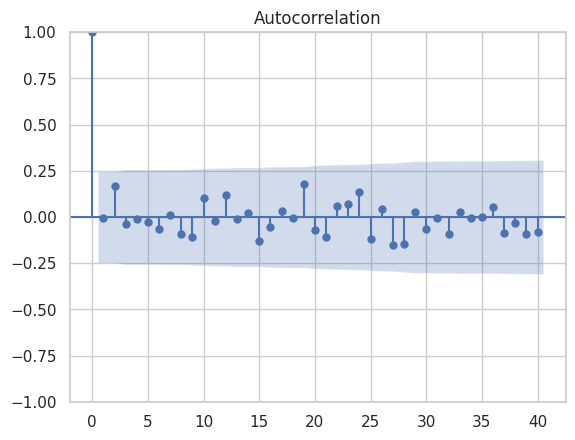

In [ ]:
# autocorrelation
sm.graphics.tsa.plot_acf(residuals, lags=40)
plt.show()

In [ ]:
#look for Durbin-Watson test in OLS summary
print(results.summary())

                             OLS Regression Results                             
Dep. Variable:     crawl requests - 2xx   R-squared:                       0.960
Model:                              OLS   Adj. R-squared:                  0.956
Method:                   Least Squares   F-statistic:                     249.7
Date:                  Sat, 06 Apr 2024   Prob (F-statistic):           6.10e-42
Time:                          13:12:37   Log-Likelihood:                -538.31
No. Observations:                    70   AIC:                             1091.
Df Residuals:                        63   BIC:                             1106.
Df Model:                             6                                         
Covariance Type:              nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------

In [ ]:
#commentary
md(f"Autocorrelation of Residuals:\n##Satisfied")

Autocorrelation of Residuals:
##Satisfied

##Ridge or Lasso Regression

Ridge is a regression technique used when you have multicollinearity problems and help prevent overfitting

Suitable for the dataset that has a higher number of predictor variables than the number of observations

**Lasso** tends to do well if there are a small number of significant parameters and the others are close to zero (ergo: when only a few predictors actually influence the response)

**Ridge** works well if there are many large parameters of about the same value (ergo: when most predictors impact the response).

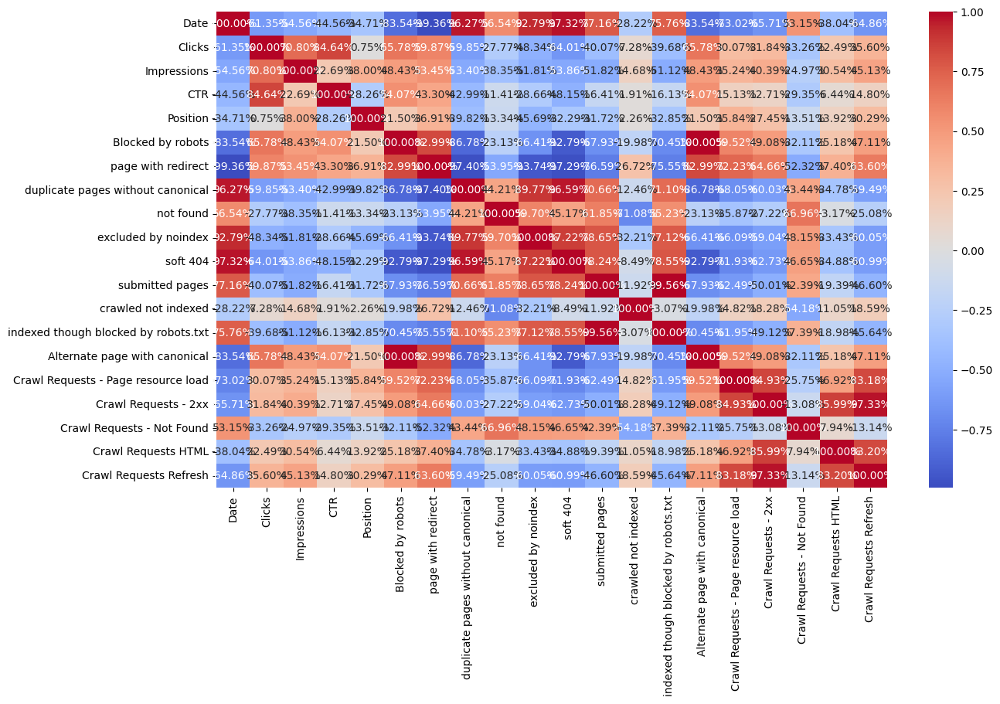

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sb
import plotly.express as px
plt.style.use('default')

df = pd.read_excel("/content/data_boucheron.xlsx")

## Splitting the dependent and independent variables
X = pd.DataFrame(df.iloc[:, :-1])
y = pd.DataFrame(df.iloc[:, -1])
## Find the correlation among the predictors
plt.figure(figsize=(14, 8))
sb.heatmap(X.corr(), annot=True,fmt=".2%", cmap='coolwarm')
plt.show()

In [ ]:
print(df.columns)

Index(['Date', 'Clicks', 'Impressions', 'CTR', 'Position', 'Blocked by robots',
       'page with redirect', 'duplicate pages without canonical', 'not found',
       'excluded by noindex', 'soft 404', 'submitted pages',
       'crawled not indexed', 'indexed though blocked by robots.txt',
       'Alternate page with canonical', 'Crawl Requests - Page resource load',
       'Crawl Requests - 2xx', 'Crawl Requests - Not Found',
       'Crawl Requests HTML', 'Crawl Requests Refresh',
       'Crawl Requests Discovery'],
      dtype='object')


In [ ]:
#drop a few columns
df.drop(columns = ["Date", "Position","CTR",'Clicks', 'Impressions','Crawl Requests Discovery'], inplace = True)


Linear Regression Train Score: 0.7470759732307807
Linear Regression Test Score: 0.6807175497826228
Ridge Regression Train Score: 0.6705486597564456
Ridge Regression Test Score: 0.7661282370415277
Lasso Regression Train Score: 0.7039575504900408
Lasso Regression Test Score: 0.724400152012098


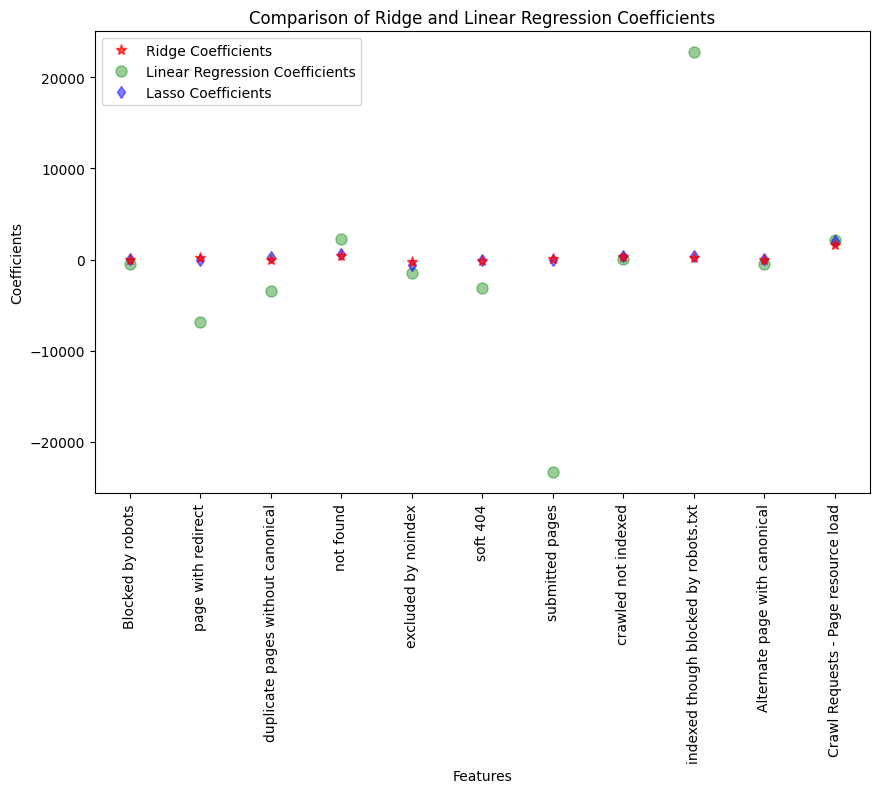

In [ ]:
#@title Test Ridge, Lasso and Linear Regression Models

# Define features and target
features = df.columns[0:11]
target = df.columns[-1]

X = df[features]
y = df[target]

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=17)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Linear Regression Model
lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

train_score_lr = lr.score(X_train_scaled, y_train)
test_score_lr = lr.score(X_test_scaled, y_test)

print("Linear Regression Train Score:", train_score_lr)
print("Linear Regression Test Score:", test_score_lr)

# Ridge Regression Model
ridge = Ridge(alpha=10)
ridge.fit(X_train_scaled, y_train)

train_score_ridge = ridge.score(X_train_scaled, y_train)
test_score_ridge = ridge.score(X_test_scaled, y_test)

print("Ridge Regression Train Score:", train_score_ridge)
print("Ridge Regression Test Score:", test_score_ridge)

# Lasso Regression Model (Not implemented in the provided script, you may need to implement it)
lasso = Lasso(alpha=10)
lasso.fit(X_train_scaled, y_train)
train_score_lasso = lasso.score(X_train_scaled, y_train)
test_score_lasso = lasso.score(X_test_scaled, y_test)

print("Lasso Regression Train Score:", train_score_lasso)
print("Lasso Regression Test Score:", test_score_lasso)

# Visualize the coefficients
plt.figure(figsize=(10, 6))
plt.plot(features, ridge.coef_, alpha=0.7, linestyle='none', marker='*', markersize=8, color='red', label='Ridge Coefficients', zorder=7)
plt.plot(features, lr.coef_, alpha=0.4, linestyle='none', marker='o', markersize=8, color='green', label='Linear Regression Coefficients')
plt.plot(lasso.coef_,alpha=0.5,linestyle='none',marker='d',markersize=6,color='blue',label='Lasso Coefficients')
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Coefficients')
plt.title('Comparison of Ridge and Linear Regression Coefficients')
plt.legend()
plt.show()


In [ ]:
print(df.columns)

Index(['Blocked by robots', 'page with redirect',
       'duplicate pages without canonical', 'not found', 'excluded by noindex',
       'soft 404', 'submitted pages', 'crawled not indexed',
       'indexed though blocked by robots.txt', 'Alternate page with canonical',
       'Crawl Requests - Page resource load', 'Crawl Requests - 2xx',
       'Crawl Requests - Not Found', 'Crawl Requests HTML',
       'Crawl Requests Refresh'],
      dtype='object')


In [ ]:
from sklearn.model_selection import train_test_split

# Define the independent variables and the dependent variable
independent_columns = [
    'Blocked by robots', 'page with redirect',
       'duplicate pages without canonical', 'not found', 'excluded by noindex',
       'soft 404', 'submitted pages', 'crawled not indexed',
       'indexed though blocked by robots.txt', 'Alternate page with canonical',
       'Crawl Requests - Page resource load',
       'Crawl Requests - Not Found', 'Crawl Requests HTML',
       'Crawl Requests Refresh']
X = df[independent_columns]  # Independent variables
y = df['Crawl Requests - 2xx']  # Dependent variable

# Use scikit-learn's train_test_split() method to split X into 80% training set and 20% testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=17)


print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(61, 14)
(27, 14)
(61,)
(27,)


In [ ]:
#@title Create a linear regression model based on Ordinary Least Squares (OLS)
# Fit the OLS model
model = sm.OLS(y_train, sm.add_constant(X_train))
results = model.fit()

intercept = results.params['const']
print("Intercept:", intercept)

# Print the summary
print(results.summary())

Intercept: -60967.402788913954
                             OLS Regression Results                             
Dep. Variable:     Crawl Requests - 2xx   R-squared:                       0.998
Model:                              OLS   Adj. R-squared:                  0.997
Method:                   Least Squares   F-statistic:                     1562.
Date:                  Sun, 14 Apr 2024   Prob (F-statistic):           2.64e-57
Time:                          12:49:06   Log-Likelihood:                -371.92
No. Observations:                    61   AIC:                             771.8
Df Residuals:                        47   BIC:                             801.4
Df Model:                            13                                         
Covariance Type:              nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------

In [ ]:
from sklearn.linear_model import Lasso

def sklearn_vif(exogs, data, alpha=1):
    '''
    This function calculates variance inflation function using sklearn with Lasso regression.

    Args:
    - exogs (list): List of exogenous variables (features).
    - data (DataFrame): DataFrame containing both exogenous and endogenous variables.
    - alpha (float): Regularization strength (default is 1 for Lasso regression).

    Returns:
    - DataFrame: DataFrame containing VIF values and tolerance values for each exogenous variable.
    '''
    # Initialize dictionaries
    vif_dict, tolerance_dict = {}, {}

    # Form input data for each exogenous variable
    for exog in exogs:
        not_exog = [i for i in exogs if i != exog]
        Xvif, yvif = data[not_exog], data[exog]

        # Fit Lasso regression model
        lasso_model = Lasso(alpha=alpha)
        lasso_model.fit(Xvif, yvif)

        # Extract R-squared from the fit
        r_squared = lasso_model.score(Xvif, yvif)

        # Calculate VIF
        vif = 1 / (1 - r_squared)
        vif_dict[exog] = vif

        # Calculate tolerance
        tolerance = 1 - r_squared
        tolerance_dict[exog] = tolerance

    # Return VIF DataFrame
    df_vif = pd.DataFrame({'VIF': vif_dict, 'Tolerance': tolerance_dict})

    return df_vif


In [ ]:
print(df.columns)

Index(['Blocked by robots', 'page with redirect',
       'duplicate pages without canonical', 'not found', 'excluded by noindex',
       'soft 404', 'submitted pages', 'crawled not indexed',
       'indexed though blocked by robots.txt', 'Alternate page with canonical',
       'Crawl Requests - Page resource load', 'Crawl Requests - 2xx',
       'Crawl Requests - Not Found', 'Crawl Requests HTML',
       'Crawl Requests Refresh'],
      dtype='object')


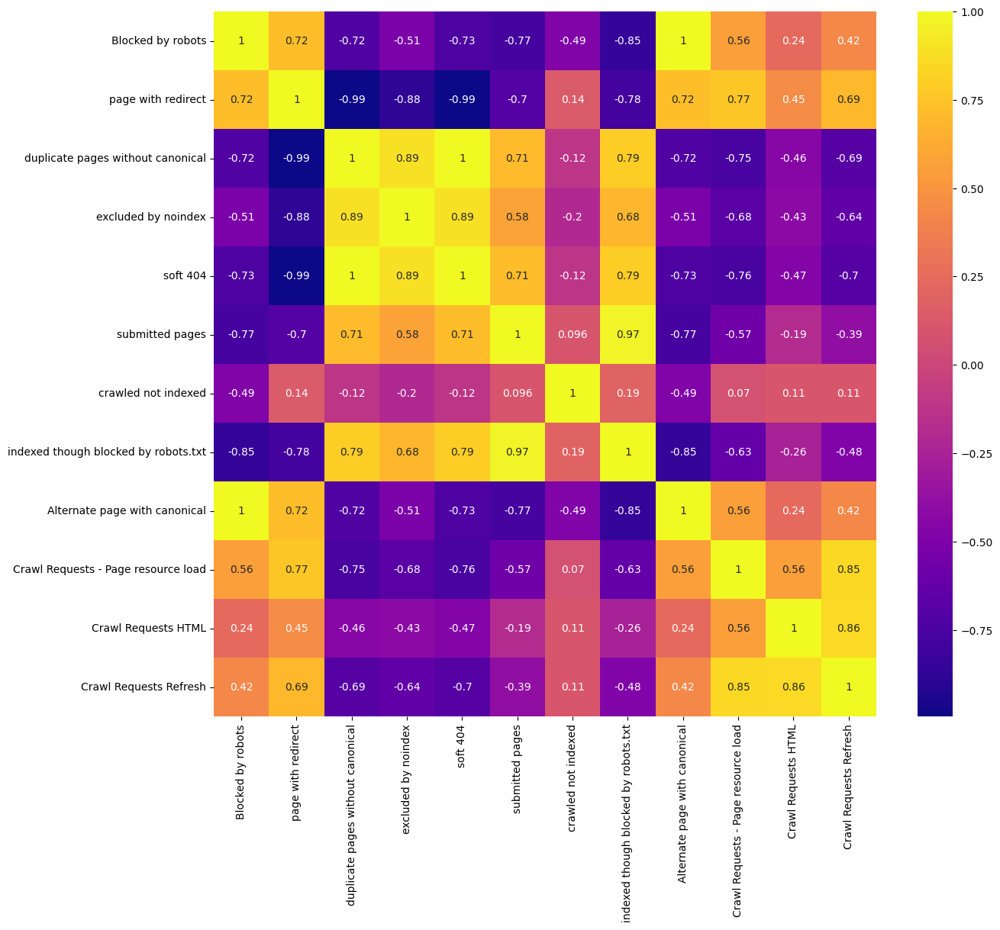

In [ ]:
#@title multi collinearity with a heatmap
#Heatmap (correlation matrix)
plt.figure(figsize=(14, 12))
sns.heatmap(df.drop(['not found','Crawl Requests - 2xx', 'Crawl Requests - Not Found'], axis=1).corr(method="spearman"), annot=True, cmap='plasma')

plt.show()

#VIF

To improve the model from multi-collinearity, you can use VIF that is a method that identifies and scores variables that correlate highly with other variables, rducing the highest ones to leave those that are more independent

**In the following example, drop as many variables as you can to keep VIF between 1 and 5**

- VIF starts at 1 and has no upper limit
- VIF = 1, no correlation between the independent variable and the other variables
- VIF exceeding 5 or 10 indicates high multicollinearity between this independent variable and the others

In [ ]:
from sklearn.linear_model import Lasso

def calc_vif(X, alpha=1):
    # Dropping a column
    X = X.drop(['not found'],axis=1)

    # Initialize VIF DataFrame
    vif = pd.DataFrame()
    vif["variables"] = X.columns

    # Calculating VIF using Lasso regression
    vif_values = []
    for i in range(X.shape[1]):
        # Extract the exogenous variables
        not_exog = X.columns[X.columns != X.columns[i]]
        Xvif, yvif = X[not_exog], X.iloc[:, i]

        # Fit Lasso regression model
        lasso_model = Lasso(alpha=alpha)
        lasso_model.fit(Xvif, yvif)

        # Extract R-squared from the fit
        r_squared = lasso_model.score(Xvif, yvif)

        # Calculate VIF
        vif_value = 1 / (1 - r_squared)
        vif_values.append(vif_value)

    vif["VIF"] = vif_values

    return vif

X = dfOutliers.iloc[:, :-1]  # Assuming the last column is the one to drop
calc_vif(X)


,variables,VIF
0,clicks,4.032124e+00
1,impressions,3.142177e+00
2,blocked by robots,4.925652e+05
3,page with redirect,3.958062e+02
4,duplicate pages without canonical,5.695976e+01
5,excluded by noindex,3.463743e+01
6,soft 404,2.680766e+02
7,submitted pages,5.859345e+03
8,crawled not indexed,4.936534e+01
9,indexed though blocked by robots.txt,5.805203e+03


In [ ]:
print(df_lasso.columns)

Index(['Blocked by robots', 'page with redirect',
       'duplicate pages without canonical', 'not found', 'excluded by noindex',
       'soft 404', 'submitted pages', 'crawled not indexed',
       'indexed though blocked by robots.txt', 'Alternate page with canonical',
       'Crawl Requests - Page resource load', 'Crawl Requests - 2xx',
       'Crawl Requests - Not Found', 'Crawl Requests HTML',
       'Crawl Requests Refresh'],
      dtype='object')


Combine the correlated variables into one and drop the others. This will reduce the multicollinearity

In [ ]:
# Assuming the operations on dfOutliers are correctly defined
df_lasso = df.copy()
df_lasso['Blocked'] = df_lasso['Blocked by robots'] - df_lasso['indexed though blocked by robots.txt']
df_lasso['Noindex'] = df_lasso['excluded by noindex'] - df_lasso['crawled not indexed']
df_lasso['Canonical issue'] = df_lasso['Alternate page with canonical'] - df_lasso['duplicate pages without canonical']
df_lasso['Crawl Requests'] = df_lasso['Crawl Requests Refresh'] - df_lasso['Crawl Requests HTML']
df_lasso = df_lasso.round(decimals=1)
X = df_lasso.drop(['Blocked','Crawl Requests - Page resource load','Canonical issue','page with redirect','submitted pages','duplicate pages without canonical','indexed though blocked by robots.txt','excluded by noindex','crawled not indexed', 'Blocked by robots','Alternate page with canonical','Crawl Requests Refresh','Crawl Requests HTML'], axis=1)
calc_vif(X)


,variables,VIF
0,soft 404,2.682129
1,Crawl Requests - 2xx,2.521060
2,Crawl Requests - Not Found,2.257937
3,Noindex,1.760355
4,Crawl Requests,2.246923


In [ ]:
#commentary
md("Lasso Multicollinearity Assumption:\n###Satisfied")

Lasso Multicollinearity Assumption:
###Satisfied

# OLS Test against Lasso_Reg - the Last Dataset before Validation

Having smoothed out multicollinearity amongs independent variables, we can now re-run OLS and quickly loop through the remaining assumptions to gauge the validity of our Regression efforts.

## Steps
1. Run OLS on the new dataset
2. Test for Normality of Residuals
3. Test for Homoscedasticity
4. Test for Multicollinearity

In [ ]:
print(X.columns)

Index(['not found', 'soft 404', 'Crawl Requests - 2xx',
       'Crawl Requests - Not Found', 'Noindex', 'Crawl Requests'],
      dtype='object')


In [ ]:
#@title Fit OLS model

# dropping redundant not found and the dependent variable from previous VIF
lasso_reg = X.drop(['not found','Crawl Requests - 2xx',], axis=1)

X_with_const = sm.add_constant(lasso_reg)  # Add constant term for intercept
ols_model = sm.OLS(y, X_with_const)
ols_results = ols_model.fit()

# Print OLS summary
print(ols_results.summary())

                             OLS Regression Results                             
Dep. Variable:     Crawl Requests - 2xx   R-squared:                       0.603
Model:                              OLS   Adj. R-squared:                  0.584
Method:                   Least Squares   F-statistic:                     31.56
Date:                  Sun, 14 Apr 2024   Prob (F-statistic):           5.62e-16
Time:                          13:20:08   Log-Likelihood:                -775.05
No. Observations:                    88   AIC:                             1560.
Df Residuals:                        83   BIC:                             1572.
Df Model:                             4                                         
Covariance Type:              nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------


In [ ]:
md("##Yay: P-Value has been defeated!\n the model is statistically significant as there is less than 5% probability that the predictors influenced the dependent variable purely by chance")

##Yay: P-Value has been defeated!
 the model is statistically significant as there is less than 5% probability that the predictors influenced the dependent variable purely by chance

## Normality Assumption with Lasso Regression

Apply a normality test to the residuals.
Common tests include the **Shapiro-Wilk** test, Kolmogorov-Smirnov test, and Anderson-Darling test.

These tests assess whether the residuals come from a normal distribution.

In [ ]:
from scipy.stats import shapiro

# Fit Lasso regression model and calculate residuals
lasso_model = Lasso(alpha=0.1)
lasso_model.fit(X_train, y_train)
residuals = y_train - lasso_model.predict(X_train)

# Shapiro-Wilk test for normality
stat, p = shapiro(residuals)
print('Shapiro-Wilk Test:')
print('Test Statistic:', stat)
print('p-value:', p)

# Interpret the p-value
alpha = 0.05
if p > alpha:
    print("The residuals are normally distributed (fail to reject H0)")
else:
    print("The residuals are not normally distributed (reject H0)")


Shapiro-Wilk Test:
Test Statistic: 0.9879562854766846
p-value: 0.8120340704917908
The residuals are normally distributed (fail to reject H0)


In [ ]:
#commentary
md("Lasso Normality Assumption:\n###Satisfied")

Lasso Normality Assumption:
###Satisfied

## Homoscedasticity

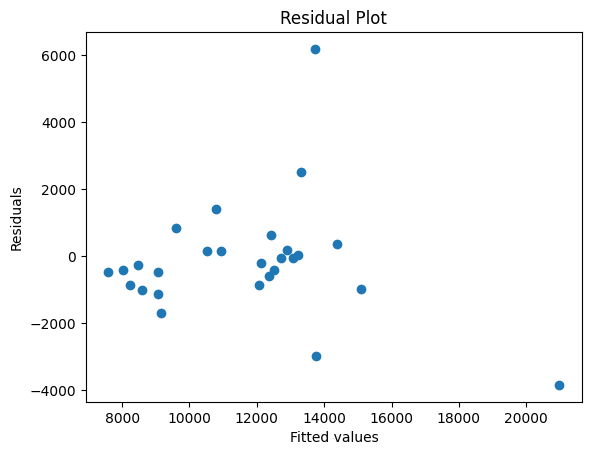

In [ ]:
import matplotlib.pyplot as plt

# Calculate residuals
lasso_resid = y_test - lasso.predict(X_test_scaled)

# Plot residuals vs. fitted values
plt.scatter(lasso.predict(X_test_scaled), lasso_resid)
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

In [ ]:
#commentary
md("Lasso Homoscedasticity Assumption:\n###Satisfied")

Lasso Homoscedasticity Assumption:
###Satisfied

##Multi collinearity

The only noticeable correlation among y variables is soft 404 vs crawl requests
##As soft 404 increase, crawl requests decrease. Makes sense

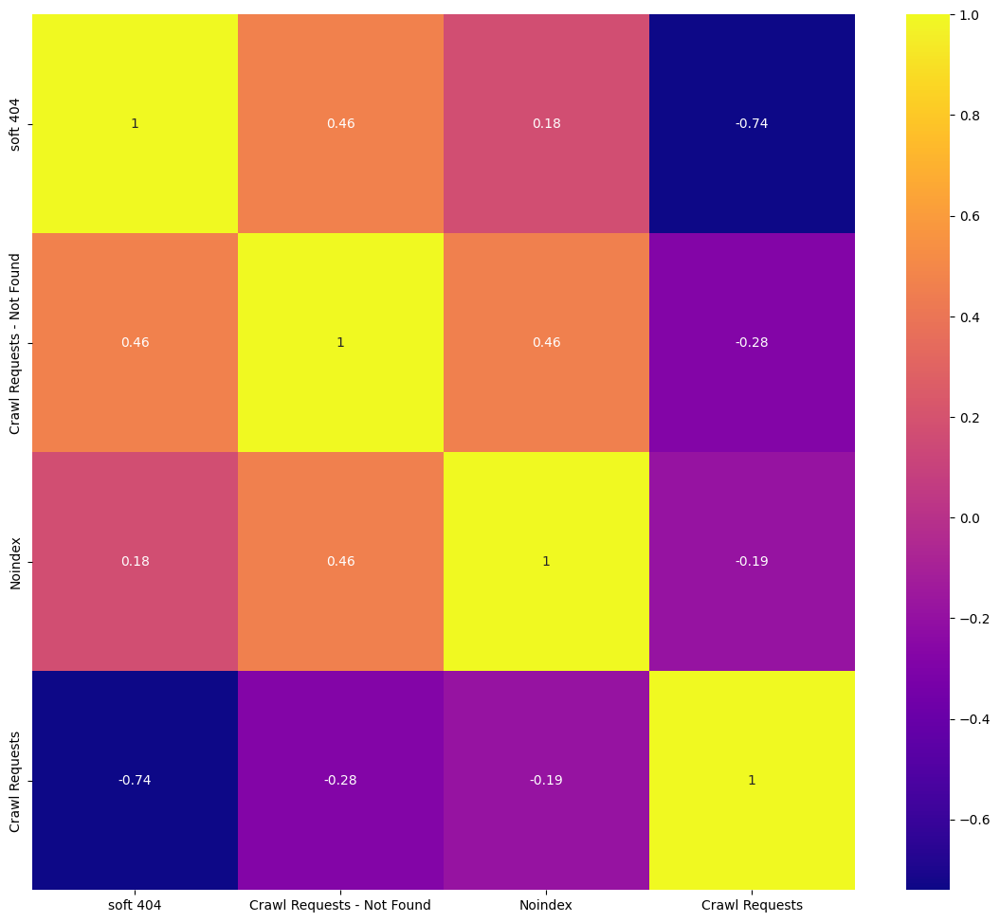

In [ ]:
#Heatmap (correlation matrix)
plt.figure(figsize=(14, 12))
sns.heatmap(lasso_reg.corr(method="spearman"), annot=True, cmap='plasma')
md("The only noticeable correlation among y variables is soft 404 vs crawl requests\n##As soft 404 increase, crawl requests decrease. Makes sense")
plt.show()

In [ ]:
md("Lasso Multicollinearity Assumption:\n###Satisfied")

Lasso Multicollinearity Assumption:
###Satisfied

# Conclusions

The Lasso regression equation based on the provided OLS summary can be written as follows:

`-Crawl Requests - 2xx`
=
−
1928.3983
−
30.8580
×
`soft 404`
+
12.7488
×
`Crawl Requests - Not Found`
−
0.7870
×
`Noindex`
+
0.7282
×
`Crawl Requests`
`Crawl Requests - 2x`x=−1928.3983−30.8580×`soft 404`+12.7488×C`rawl Requests - Not Found`−0.7870×Noindex+0.7282×`Crawl Requests`

In this equation:

- **soft 404**, **Crawl Requests - Not Found**, **Noindex**, and **Crawl Requests** are the **independent variables**.
- 1928.3983 is the intercept term.

- The coefficients of the independent variables represent the impact of each variable on the **dependent variable**, **Crawl Requests - 2xx**.

## Coefficients

From the OLS summary:

- `soft 404` = -30.8580.
- `Crawl Requests - Not Found` = 12.7488.
- `Noindex` = -0.7870.
- `Crawl Requests` = 0.7282.

Among these coefficients, the variable with the largest absolute coefficient is **soft 404**, which has a coefficient of approximately -30.8580.

---

As the object of the analysis was investigating the root cause for a decrease in crawl requests for an eCommerce website, we can conclude that:

##**Crawl Requests decrease with -30.8580 if Soft 404 pages increase by one**.

In simple terms,
### A Decrease in Crawl Requests is caused by an increase in Soft 404 pages
